In [114]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import StandardScaler
from chart_display import IndicatorMerger

### Setting dataframes that will support the analysis

In [115]:
#Charging datasets
datasets_info = pd.read_csv("Data_info.csv", delimiter=";")
sp500_index = pd.read_csv("Datasets/S&P500.csv", delimiter=",")
ticker_prices = pd.read_csv("Datasets/tickers.csv", delimiter=",", index_col=0)
sp500_companies = pd.read_csv("Datasets/Sp500_companies.csv", delimiter=",")
sp500_mkt_cap = pd.read_csv("Datasets/sp500_tickers_market_cap.csv", delimiter=";")
cpi_df = pd.read_csv("Datasets/CPI.csv", delimiter=",")
dxy = pd.read_csv("Datasets/DXY.csv", delimiter=",")

In [116]:
# Adjustments in tickers dataset
ticker_prices.ffill(inplace=True)  
ticker_prices.bfill(inplace=True)  

# Tickers 'GOOG' and 'GOOGL' need to merge to have the Alphabet result
ticker_prices['GOOGL'] = ticker_prices['GOOG'] + ticker_prices['GOOGL']

ticker_prices.drop(columns=['GOOG'], inplace=True)

In [117]:
# Adjustments in some ticker codes
for index, row in sp500_mkt_cap.iterrows():
    if row['Symbol'] == 'BRK.B':
        sp500_mkt_cap.at[index, 'Symbol'] = 'BRK-B'
    if row['Symbol'] == 'BF.B':
        sp500_mkt_cap.at[index, 'Symbol'] = 'BF-B'

In [118]:
dataframes = {}

for index, rows in datasets_info.iterrows():
    path = rows['File_path']
    dataset_name = rows['Series_Name']
    dataframes[dataset_name] = pd.read_csv(path, delimiter=',')

dataframes['SP500'] = pd.DataFrame({'Date': sp500_index['Date'], 'SP500': sp500_index['Close']})
dataframes['CPI'] =   pd.DataFrame({'Date': cpi_df['Date'], 'CPI': cpi_df['CPI Rate']})
dataframes['DXY'] =   pd.DataFrame({'Date': dxy['Date'], 'DXY': dxy['DX-Y.NYB']})

In [119]:
# Recession periods
recession_periods = [
    # ('1973-11-01', '1975-03-01'),
    # ('1980-01-01', '1980-07-01'),
    # ('1981-07-01', '1982-11-01'),
    ('1990-07-01', '1991-03-01'),
    ('2001-03-01', '2001-11-01'),
    ('2007-12-01', '2009-06-01'),
    ('2020-02-01', '2020-04-01')
]

recession_periods = [(pd.to_datetime(start), pd.to_datetime(end)) for start, end in recession_periods]

**List of indicators:** 
- Bank_credit
- Real_Interest_rate_10y
- Real_estate_prices_com
- Consumer_loans
- Market_yield_10y
- Price_index
- Insured_unemployment_Cotinued
- Delinquency_rate
- Effective_rate_Federal
- GDP
- Owners_equity
- M2
- Price_index_Mean
- NASDAQ
- Savings_rate
- Real_estate_loans
- Real_GDP
- Sticky_prices
- Total_unemployed
- Unemployment_level
- Unemployment_rate
- Population
- Nonfarm_business_productivity
- Real_earnings
- Total_reserves
- BTFP
- DW
- Total_public_debt
- Income_security_debt
- Social_security_debt
- Medicare
- Interest_payments
- National_Defense
- Government_spending
- Government_receipts

### Correlation Analysis

Starting with S&P500 correlation between all loaded series 

In [120]:
# Create a combined dataframe using Date as index
combined_df = dataframes['SP500'].set_index('Date')
for name, df in dataframes.items():
    if name != 'SP500':
        combined_df[name] = df.set_index('Date')

# Calculate correlation of all columns
scaler = StandardScaler()
standardized_data = scaler.fit_transform(combined_df)
standardized_df = pd.DataFrame(standardized_data, columns=combined_df.columns, index=combined_df.index)
correlation_df = standardized_df.corr()


# Filtering only S&P correlation
sp500_correlation = correlation_df['SP500']
result_df = sp500_correlation.reset_index()
result_df.columns = ['Indicator', 'Correlation with SP500']


In [121]:

# Since correlation is between -1 and 1 need to classify using string and abs values
def classify_correlation(correlation):
    abs_corr = abs(correlation)
    if abs_corr == 1:
        return 'Perfect'
    elif abs_corr >= 0.75:
        return 'Strong'
    elif abs_corr >= 0.5:
        return 'Moderate'
    elif abs_corr >= 0.25:
        return 'Weak'
    else:
        return 'Very weak'

result_df['Classification'] = result_df['Correlation with SP500'].apply(classify_correlation)


custom_order = ['Perfect', 'Strong', 'Moderate', 'Weak', 'Very weak']

result_df['Classification'] = pd.Categorical(result_df['Classification'], categories=custom_order, ordered=True)

result_df = result_df.sort_values(by=['Classification', 'Correlation with SP500'], ascending=[True, False])
result_df


,Indicator,Correlation with SP500,Classification
0,SP500,1.000000,Perfect
14,NASDAQ,0.990573,Strong
11,Owners_equity,0.965491,Strong
35,Government_receipts,0.955025,Strong
12,M2,0.953326,Strong
28,Total_public_debt,0.946785,Strong
10,GDP,0.940503,Strong
30,Social_security_debt,0.938200,Strong
1,Bank_credit,0.928539,Strong
31,Medicare,0.926698,Strong


  - Home equity is the indicator with the highest correlation with S&P

In [122]:
df1 = dataframes['SP500']
df2 = dataframes['Owners_equity']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - A great starting point, since the lastest financial crysis begin there, the chart shows recession periods in grey area
 - No recent drops in the indicator, but the exponential growth seen in the past is no longer a trend since 2022

In [123]:
df1 = dataframes['Real_earnings']
df2 = dataframes['Total_unemployed']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - We can relate home equity with real earnings, and real earnings with unemployment rate
 - Both real earnings and home equity are on similar movement on the past years, a good sign, since in 2008 earnings were falling/standing and home equity was rising
 - But something odd is happening, earnings are grown even with high unemployment

In [124]:
df1 = dataframes['Real_earnings']
df2 = dataframes['Insured_unemployment_Cotinued']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - I believe the continuous claims explain why real earnings keep raising even with high unemployment rate

In [125]:
df1 = dataframes['SP500'].copy()
df2 = dataframes['Nonfarm_business_productivity'].copy()
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - So, lets dive in productivity, to understand how it looks like compared with S&P, since its has a strong correlation between those two
 - The productivity chart its not telling much, but probably we have some valuable information if we look it into cycles

In [126]:
# Set the productivity df
prod_df = dataframes['Nonfarm_business_productivity'].copy()
prod_df.ffill(inplace=True)
prod_df['Date'] = pd.to_datetime(prod_df['Date'])
prod_df.set_index('Date', inplace=True)

In [127]:
# Resample to 5-year periods and calculate the mean of productivity
mean_productivity_5yr = prod_df['OPHNFB'].resample('5YE').mean().reset_index()
mean_productivity_5yr.columns = ['Date', 'Mean_OPHNFB']
mean_productivity_5yr['Period'] = mean_productivity_5yr['Date'].apply(lambda x: f"{x.year - 5}-{x.year}")
mean_productivity_5yr['% Evolution'] = mean_productivity_5yr['Mean_OPHNFB'].pct_change() * 100
mean_productivity_5yr.drop(columns=['Date'], inplace=True)
mean_productivity_5yr = mean_productivity_5yr[['Period', 'Mean_OPHNFB', '% Evolution']]
mean_productivity_5yr


,Period,Mean_OPHNFB,% Evolution
0,1985-1990,58.252066,NaN
1,1990-1995,61.905944,6.272529
2,1995-2000,68.552820,10.737058
3,2000-2005,80.563996,17.521052
4,2005-2010,89.647964,11.275470
5,2010-2015,96.218158,7.328882
6,2015-2020,103.258273,7.316826
7,2020-2025,111.860151,8.330449


- In 1995 until 2010 the productivity have a huge boost, after that it is reducing, this coincides with the boom of the internet
- Maybe we can see the composition of S&P500 to have  glince of what are the companies that drives the economy

### Lets take something out the way first
 - CPi is a great indicator, and its used for many analysis but here the inflation index dont have a huge explicative power, maybe in a predict model it could be pretty helpful, just to make sure let's take a look

In [128]:
df1 = dataframes['DXY'].copy()
df2 = dataframes['CPI'].copy()
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()


 - We have something interesting to notice, if we compare CPI vs DXY we can see some kind of delay, looks like the currency weakens, inflation rises and after a while when currency strengthen inflation drops, interesting pattern, its not occur 100% of the time but its interesting to see what looks like a stagnation on the valuation of the dollar after a peak and a downtrend in inflation into the most recent data

### Back on  track
 - Lets decompose S&P500 and see the performance of each company that is part of it

In [129]:
# Calculate the cumulative return for each ticker
cumulative_returns = (ticker_prices / ticker_prices.iloc[0]) - 1
sp500_cumulative_return = (sp500_index['Close'] / sp500_index['Close'].iloc[0]) - 1

# Determine the weights
weights = cumulative_returns.iloc[-1] / sp500_cumulative_return.iloc[-1]
weights_df = weights.to_frame(name='Weight_index')
weights_df['Weight (%)'] = (weights_df['Weight_index'] / weights_df['Weight_index'].sum()) * 100
weights_df['Weight (%) temp'] = (weights_df['Weight_index'] / weights_df['Weight_index'].sum()) * 100
weights_df = sp500_mkt_cap.set_index('Symbol')[['Weight']].join(weights_df)
weights_df['Weight (%)'] = (weights_df['Weight'] * weights_df['Weight (%) temp']) * 100
weights_df = weights_df.dropna()
weights_df = weights_df.drop(['Weight', 'Weight (%) temp'], axis=1)
weights_df.sort_values(by='Weight (%)', ascending=False, inplace=True)

# Add a cumulative sum column representing the fraction of total performance
weights_df['Cumulative Weight'] = weights_df['Weight (%)'].cumsum()

In [130]:
# Count the number of companies that make up the first 90% of the cumulative weight
first_90_percent_count = weights_df[weights_df['Cumulative Weight'] < 90].shape[0]

# Calculate the remaining companies
remaining_count = weights_df.shape[0] - first_90_percent_count

# Create a table to visualize the counts
count_df = pd.DataFrame({
    'Performance (1990 - 2025)': ['90% of all Performance', 'Remaining 10% of Performance'],
    'Company Count': [first_90_percent_count, remaining_count]
})

count_df

,Performance (1990 - 2025),Company Count
0,90% of all Performance,30
1,Remaining 10% of Performance,472


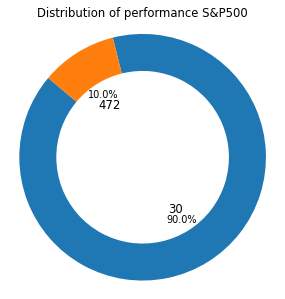

In [131]:
# plotting the data
sizes = [90, 10]  
sub_labels = [30, 472] 

fig, ax = plt.subplots(figsize=(5, 5), dpi=70)
wedges, texts, autotexts = ax.pie(sizes, autopct='%1.1f%%', startangle=140, wedgeprops=dict(width=0.3))

for i, wedge in enumerate(wedges):
    angle = (wedge.theta2 - wedge.theta1) / 2.0 + wedge.theta1
    x = (0.5 * math.cos(math.radians(angle)))  
    y = (0.5 * math.sin(math.radians(angle)))  
    ax.text(x, y, sub_labels[i], horizontalalignment='center', verticalalignment='center', fontsize=12, color='black')

plt.title("Distribution of performance S&P500")
plt.axis('equal')  
plt.show()

 - An astonished number of 30 companies are responsible for 90% of all S&P500 performance from the past 35 years
 - This concentration is a concern point
 - But what are those companies?

In [132]:
# Top tickers that compose 90% performance
top_tickers = weights_df[weights_df['Cumulative Weight'] <= 90]
top_tickers = top_tickers[::-1]

fig = px.bar(
    top_tickers,
    x='Weight (%)',
    y=top_tickers.index,
    orientation='h',
    labels={'Weight (%)': 'Weight (%)', 'index': 'Tickers'},
    title='Top 30 SP500 Tickers by Weight Compared to SP500 Index - (1990-2025)'
)

fig.update_layout(
    xaxis_title='Weight (%)',
    yaxis_title='Tickers',
    height=800,  
    width=1000   
)

fig.show()

In [133]:
# Indetifying the companies
companies_id = top_tickers.merge(sp500_companies, left_index=True, right_on='Symbol')
companies_id = companies_id[::-1]
companies_id = companies_id[['Security', 'Symbol', 'GICS Sector', 'Weight (%)' ]]
companies_id.reset_index(drop=True, inplace=True)
companies_id

,Security,Symbol,GICS Sector,Weight (%)
0,Nvidia,NVDA,Information Technology,40.936426
1,Amazon,AMZN,Consumer Discretionary,15.654820
2,Microsoft,MSFT,Information Technology,11.715337
3,Apple Inc.,AAPL,Information Technology,10.272494
4,UnitedHealth Group,UNH,Health Care,2.545999
5,Netflix,NFLX,Communication Services,0.964415
6,"Tesla, Inc.",TSLA,Consumer Discretionary,0.932447
7,Cisco,CSCO,Information Technology,0.903662
8,Broadcom,AVGO,Information Technology,0.717518
9,Lam Research,LRCX,Information Technology,0.494874


 - Make sense that Nvidia is the winner on this, thanks to the constant growing of GPU demand leading by evolution of games softwares requires also an improvement in the hardware to follow better graphs
 - Also the growth in AI requires better chips that only Nvidia is capable of produce
 - Even though this level of growth dont look very sustainable
 - Amazon, Microsoft and Apple are huge players on overall performance
 - Lets remind that S&P500 has this name for a reason, because the index has 500 companies in it. Understand that the greatest index in the word in a greatest economy in the world lying 90% of the performance in 30 companies sounds quite concernable

In [134]:
# Sector count
sector_count = companies_id['GICS Sector'].value_counts()

fig = go.Figure(go.Pie(
    labels=sector_count.index,
    values=sector_count.values,
    textinfo='percent',
    insidetextorientation='radial',
    marker=dict(line=dict(color='white', width=2))
))

fig.update_layout(
    title_text='Sector Representation of Top Companies in S&P 500',
    width=600, 
    height=600)  

fig.show()

 - Clustering the performance by sector the tech sector correspond with more than 60% of the S&P performance, if we consider that Amazon and Netflix have a great part of their business in tech and maybe 
 change their labels to tech, we can say that between 60% and 75% of the S&P performance were from those companies

### Ok, but is not possible that we just remain like that and keep going up forever?

 - If that is a possibility so market concetration is really not a problem at all, but to make it a real option we need to look how well the economy is going

In [135]:
df1 = dataframes['SP500'].copy()
df2 = dataframes['M2'].copy()
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - M2 is growing fast...This and the huge boost in M2 after the pandemic can say something about market concentration, mainly because a great amount of this money goes to venture capital funds in form of loans wich in turn goes massively to tech industry

In [136]:
# M2 emission analysis 
m2_df = dataframes['M2'].copy()

# Defining a breaking point (Pandemic)
after_2020 = m2_df[m2_df['Date'] >= '2020-02-01'].dropna()
before_2020 = m2_df[m2_df['Date'] < '2020-02-01'].dropna()

m2_after2020 = max(after_2020['M2SL']) - min(after_2020['M2SL'])
m2_before_2020 = max(before_2020['M2SL']) - min(before_2020['M2SL'])
m2_combined = {
    'M2 (T)': [m2_after2020, m2_before_2020],
    'Percentages': [m2_after2020 / (m2_after2020 + m2_before_2020) * 100, m2_before_2020 / (m2_after2020 + m2_before_2020) * 100]
}
df_combined = pd.DataFrame(m2_combined, index=['After 2020', 'Before 2020'])
df_combined.loc['Total'] = df_combined.sum()
df_combined['M2 (T)'] = df_combined['M2 (T)'].map('{:,.0f}'.format)
df_combined['Percentages'] = df_combined['Percentages'].map('{:.0f}%'.format)


df_combined.index.name = "M2 Created:"
df_combined

,M2 (T),Percentages
M2 Created:,,
After 2020,"6,269",34%
Before 2020,"12,287",66%
Total,"18,556",100%


 - To spice things up, 34% of all money landing to existence in the past 35 years was made in the past 5 years
 - If we assume that this money is feeding a huge part of the industry we also need to assume that this money is keeping in high level to maintain the engines turning 

In [137]:
#Analysing the M2 evolution
m2_df['Date'] = pd.to_datetime(m2_df['Date'])
m2_df['Year'] = m2_df['Date'].dt.year
m2_evolution = m2_df.groupby('Year')['M2SL'].sum().reset_index()
m2_evolution['% Evolution'] = m2_evolution['M2SL'].pct_change() * 100
m2_evolution = m2_evolution[m2_evolution['Year'] < 2025 ]

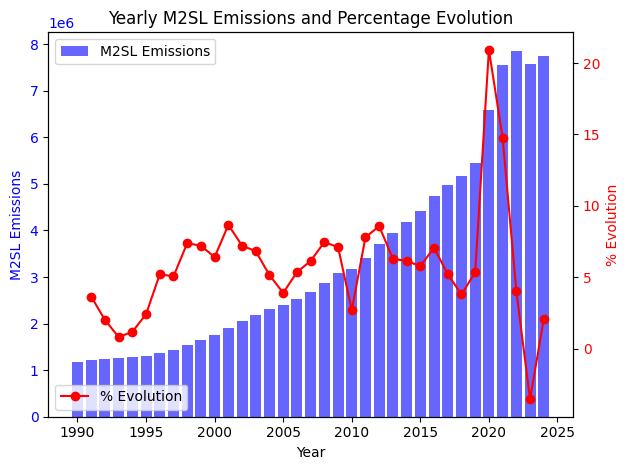

In [138]:
# Ploting the evolution
m2_evolution['Year'] = m2_evolution['Year'].astype(int) 

fig, ax1 = plt.subplots()

ax1.bar(m2_evolution['Year'], m2_evolution['M2SL'], color='b', alpha=0.6, label='M2SL Emissions')
ax1.set_xlabel('Year')
ax1.set_ylabel('M2SL Emissions', color='b')
ax1.tick_params(axis='y', labelcolor='b')

ax2 = ax1.twinx()
ax2.plot(m2_evolution['Year'], m2_evolution['% Evolution'], color='r', marker='o', label='% Evolution')
ax2.set_ylabel('% Evolution', color='r')
ax2.tick_params(axis='y', labelcolor='r')

plt.title('Yearly M2SL Emissions and Percentage Evolution')
fig.tight_layout()
ax1.legend(loc='upper left')
ax2.legend(loc='lower left')

plt.show()

 - Interesting enough the M2 production rate in plumeting
 - Wich bring us to the topic of interest rate

In [141]:
feds_rate = pd.DataFrame(dataframes['Effective_rate_Federal'])
feds_rate['Date'] = pd.to_datetime(feds_rate['Date'])
#feds_rate = feds_rate.ffill(inplace=True)

fig = px.line(feds_rate, x='Date', y='FEDFUNDS')

fig.update_layout(
    title_text='FED Funds Rate',
    template='plotly_dark',
    width=800,  
    height=600  
)
fig.show()

 - After a long period of high interest rates, FED decides to lower interest rates, and this matches with the increase in the M2 rate because lower interest rates = more loans = more money in circulation (M2)
 - But will FED keeps lowering it? If yes it will heat the economy, but also the prices of goods and services (S&P500 included) ate expense of government popularity

In [142]:
df1 = dataframes['SP500']
df2 = dataframes['Effective_rate_Federal']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - Effective Fed funds rate has the lowest correlation with S&P500, even though it can say a lot about what happens in history
 - In the past years every time we have a drop in interest rates it lead to a recession. Will this time be different?

### Financial crisis always involve them: The banks

In [143]:
df1 = dataframes['Effective_rate_Federal']
df2 = dataframes['Bank_credit']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - Bank credit growing in a lower pace since the recent rising in interest rates, but its possible to see a decline in effective rate wich can lead to a new cycle of M2 expansion (credit)

In [144]:
df1 = dataframes['SP500']
df2 = dataframes['Real_Interest_rate_10y']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - As the interest rates are getting lower S&P has more room to grow
 - Interesting enough, the S&P follow the recent upper movement of the 10y t-bills


In [145]:
df1 = dataframes['DW']
df2 = dataframes['BTFP']
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - Government makes available liquidity tools for banks jeeps its solvency, 2008 Discount Window had a peak, and most recently BTFP was created to help banks in the most recent crysis
 - Some people say that when BTFP reaches zero the banking system will colapse, its very near from it, not sure if this prediction will come to reality

In [146]:
reserves = dataframes['Total_reserves']
gdp_df = dataframes['GDP']
reserves_gdp = pd.DataFrame({"Date": reserves['Date'], 'TOTRESNS': reserves['TOTRESNS'], 'GDP': gdp_df['GDP']})
reserves_gdp['Ratio/GDP %'] = reserves_gdp['TOTRESNS'] / reserves_gdp['GDP'] * 100
reserves_gdp = reserves_gdp[['Date', 'Ratio/GDP %']]
reserves_gdp

,Date,Ratio/GDP %
0,1990-01-01,1.071057
1,1990-01-02,1.016774
2,1990-01-03,1.016774
3,1990-01-04,1.016774
4,1990-01-05,1.016774
...,...,...
12780,2024-12-28,11.031181
12781,2024-12-29,11.031181
12782,2024-12-30,11.031181
12783,2024-12-31,11.031181


In [147]:
df1 = dataframes['Total_reserves']
df2 = reserves_gdp
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - The bank reserves are on the highest level of all time, both in amount and GDP representation

### What about government debt?

In [148]:
public_debt = dataframes['Total_public_debt'].copy()
debt_gdp = pd.merge(public_debt, gdp_df, on='Date')
debt_gdp.ffill(inplace=True)
debt_gdp['Debt GDP%'] = (debt_gdp['GFDEBTN'] / 1000) / debt_gdp['GDP'] * 100
debt_gdp_df = debt_gdp[['Date', 'Debt GDP%']]

In [149]:
df1 = dataframes['Total_public_debt']
df2 = debt_gdp_df.copy()
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - US Government debt is skyrocket needs to decrease a lot to reach healthy levels. At a stagering 120% of GDP seems like it only will get worse

In [150]:
isd = pd.DataFrame(dataframes['Income_security_debt'])
ssd = pd.DataFrame(dataframes['Social_security_debt']) 
medicare = pd.DataFrame(dataframes['Medicare'])
ip = pd.DataFrame(dataframes['Interest_payments'])
national_defence = pd.DataFrame(dataframes['National_Defense'])

ismin = pd.merge(isd, ssd, on='Date')
ismin = pd.merge(ismin, medicare, on='Date')
ismin = pd.merge(ismin, ip, on='Date')
ismin = pd.merge(ismin, national_defence, on='Date')
ismin.ffill(inplace=True)
ismin['ISMIN Debt'] = ismin[['G160341A027NBEA', 'W823RC1', 'W824RC1', 'A091RC1Q027SBEA', 'FDEFX']].sum(axis=1)
ismin = ismin[['Date', 'ISMIN Debt']]


In [165]:
total_spending = dataframes['Government_spending'].copy()
total_spending['ISMIN%'] = ismin['ISMIN Debt'] / total_spending['W068RCQ027SBEA'] * 100
total_spending.ffill(inplace=True)
total_spending = total_spending[['Date','ISMIN%']]

In [166]:
df1 = dataframes['Government_spending']
df2 = total_spending.copy()
merger = IndicatorMerger(df1, df2, recession_periods, datasets_info)
merger.run()

 - ISMIN stands for: Income security. Social security, Medicare, Interest payments and Natinal defense. And is the sum of all debts
 - ISMIN % is the ratio of those debts with all the government spending
 - The actual ISMIN is around 66% (6.9 Trillion) and is walking sideways for a long period, with some volatility along the way

In [167]:
government_spending = pd.DataFrame(dataframes['Government_spending'])
government_receipts = pd.DataFrame(dataframes['Government_receipts'])

government_spending['Date'] = pd.to_datetime(government_spending['Date'])
government_receipts['Date'] = pd.to_datetime(government_receipts['Date'])

In [168]:
trace_spending = go.Scatter(x=government_spending['Date'], y=government_spending['W068RCQ027SBEA'], mode='lines', name='Government Spending', line=dict(color='red', width=4))
trace_receipts = go.Scatter(x=government_receipts['Date'], y=government_receipts['FGRECPT'], mode='lines', name='Government Receipts', line=dict(color='blue', width=4))
layout = go.Layout(title='Government Spending vs Receipts (Bi)', xaxis=dict(title='Date'), yaxis=dict(title='Values'), width=600)
fig = go.Figure(data=[trace_spending, trace_receipts], layout=layout)
fig.show()

 - This chart its just confirming what we already know, government spending are much higher than the receipts, and this difference keep growing